In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import os
os.chdir('..')

import warnings
warnings.filterwarnings('ignore', '', UserWarning)

import torch
import torchvision

torch.manual_seed(1)
torch.cuda.manual_seed(1)

In [2]:
dataset_params = {
    'dataset': 'celeba64',
    'batch_size': 32,
    'cuda': True,
    'root': 'data'
}

from src.utils import get_datasets
train_loader, test_loader, (width, height, channels) = get_datasets(
    **dataset_params)

Loading celeba64 dataset...
Done!



In [6]:
model_params = {
    'dataset': 'celeba',
    'width': width,
    'height': height,
    'channels': channels,
    'kernel_szs': '32,32,64,64',
    'hidden_sz': 256,
    'latent_sz': 800,
    'learning_rate': 1e-3,
    'alpha': 1e-2,
    'device': 'cuda',
    'log_interval': 1000,
    'normalize': False,
    'flatten': False
}

from src.models.conv_vsc import ConvolutionalVariationalSparseCoding
convvsc = ConvolutionalVariationalSparseCoding(**model_params)

In [7]:
%%time
training_params = {
    'train_loader': train_loader,
    'test_loader': test_loader,
    'epochs': 6,
    'report_interval': 2,
    'sample_sz': 64,
    'reload_model': False,
    'checkpoints_path': 'results/checkpoints',
    'logs_path': 'results/logs',
    'images_path': 'results/images'
}

convvsc.run_training(**training_params)

Training ConvVSC model...
Train Epoch: 1 [0/100000 (0%)]	Loss: 12146.763672
Train Epoch: 1 [32000/100000 (32%)]	Loss: 6899.135742
Train Epoch: 1 [64000/100000 (64%)]	Loss: 7037.770996
Train Epoch: 1 [96000/100000 (96%)]	Loss: 6881.159180
====> Epoch: 1 Average loss: 7002.2717
====> Test set loss: 6730.6389 - VLB-ConvVSC : 215380.4444
Train Epoch: 2 [0/100000 (0%)]	Loss: 6661.881836
Train Epoch: 2 [32000/100000 (32%)]	Loss: 6268.242188
Train Epoch: 2 [64000/100000 (64%)]	Loss: 6262.692383
Train Epoch: 2 [96000/100000 (96%)]	Loss: 6643.002930
====> Epoch: 2 Average loss: 6666.6029
====> Test set loss: 6639.5382 - VLB-ConvVSC : 212465.2237
Train Epoch: 3 [0/100000 (0%)]	Loss: 6793.913574
Train Epoch: 3 [32000/100000 (32%)]	Loss: 6427.360840
Train Epoch: 3 [64000/100000 (64%)]	Loss: 6886.359863
Train Epoch: 3 [96000/100000 (96%)]	Loss: 6930.929688
====> Epoch: 3 Average loss: 6621.9878
====> Test set loss: 6603.3264 - VLB-ConvVSC : 211306.4454
Train Epoch: 4 [0/100000 (0%)]	Loss: 6713.8623

In [9]:
len(train_loader)

3125

In [8]:
import numpy as np
import matplotlib.pyplot as plt

def plot_image(img, ax, title):
    ax.imshow(np.transpose(img, (1,2,0)), interpolation='nearest')
    ax.set_title(title, fontsize=20)
    
def to_numpy(image, vsc):
    return torchvision.utils.make_grid(
        image.view(1, vsc.channels, vsc.height, vsc.width)
    ).cpu().detach().numpy()
    
def plot_encoding(image, vsc, latent_sz, alpha, width=1/7):
    image = vsc.transform(image).to(vsc.device)
    decoded, mu, logvar, logspike = vsc.model.forward(image)
    z = vsc.model.reparameterize(mu, logvar, logspike)
    img = vsc.inverse_transform(vsc.model.decode(z))
    z = z.cpu().detach().numpy()[0]
    
    fig, (ax0, ax1, ax2) = plt.subplots(nrows=1, ncols=3, figsize=(21,7))
    
    plot_image(to_numpy(image, vsc), ax0, 'Input Image')
    
    ax1.bar(np.arange(latent_sz), height=z, width=width, align='center')
    ax1.scatter(np.arange(latent_sz), z, color='blue')
    ax1.set_title(r"Latent Dimension %d - $\alpha$ = %.2f " % \
                  (latent_sz, alpha), fontsize=20)
    
    plot_image(to_numpy(img, vsc), ax2, 'Decoded Image')
    plt.subplots_adjust(hspace=0.5)

In [10]:
images, _ = iter(test_loader).next()

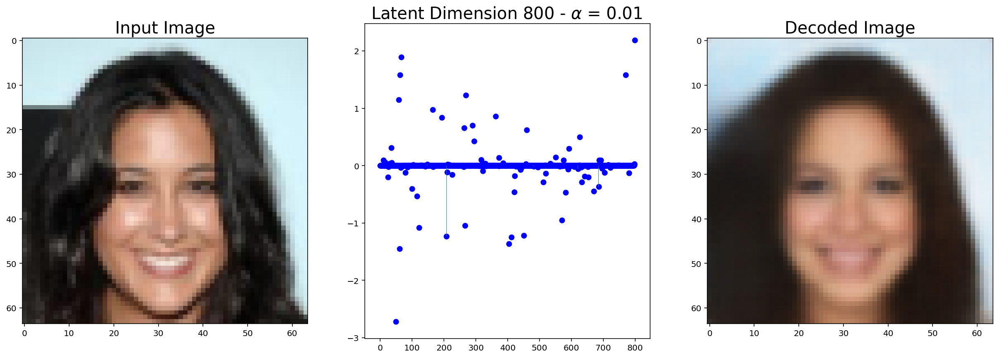

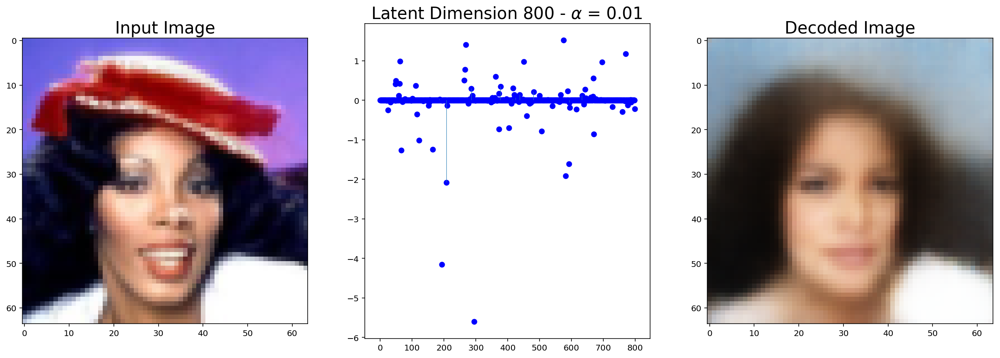

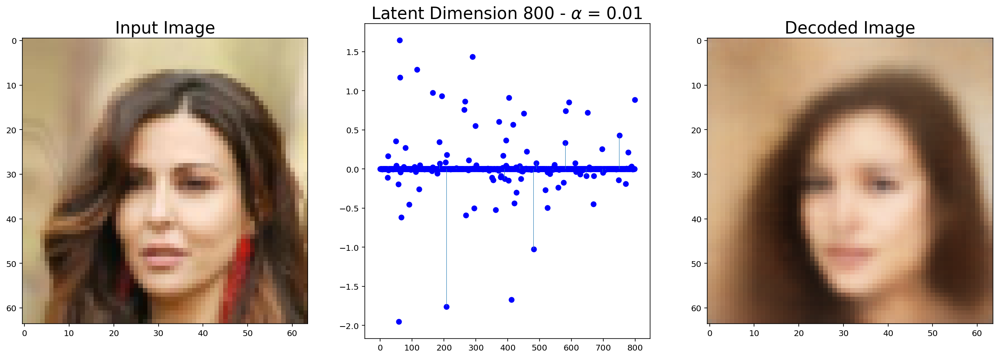

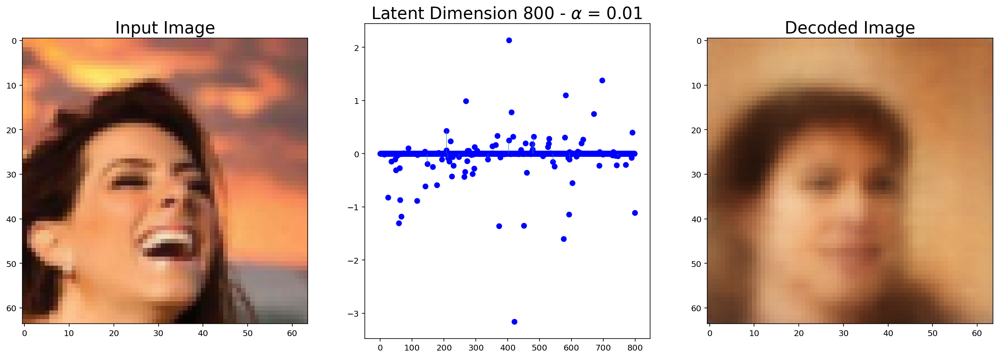

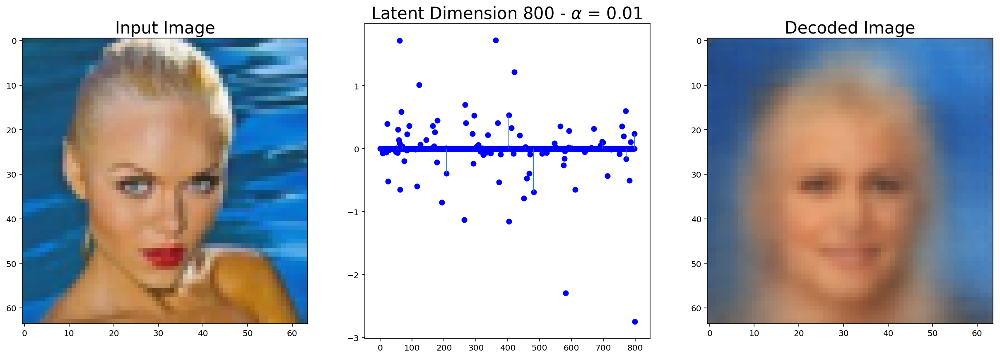

...

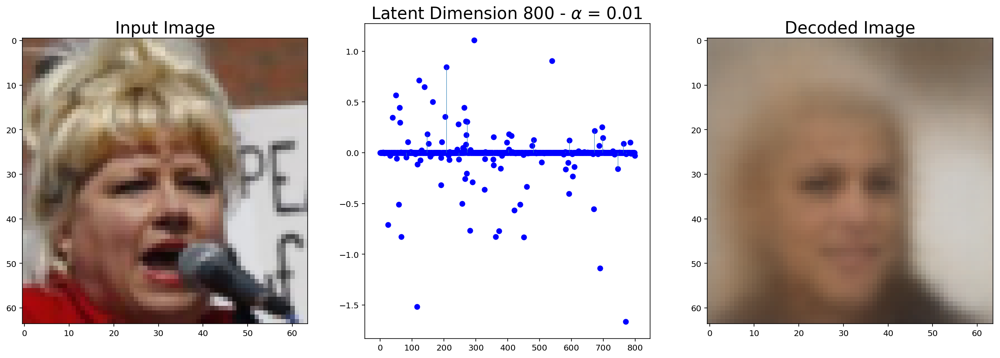

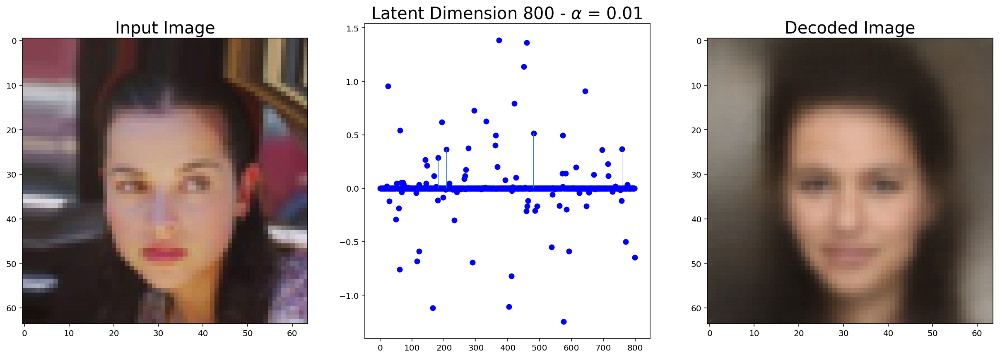

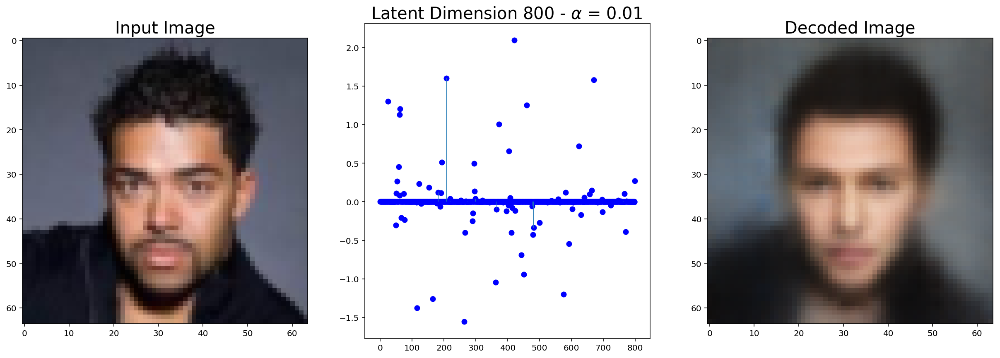

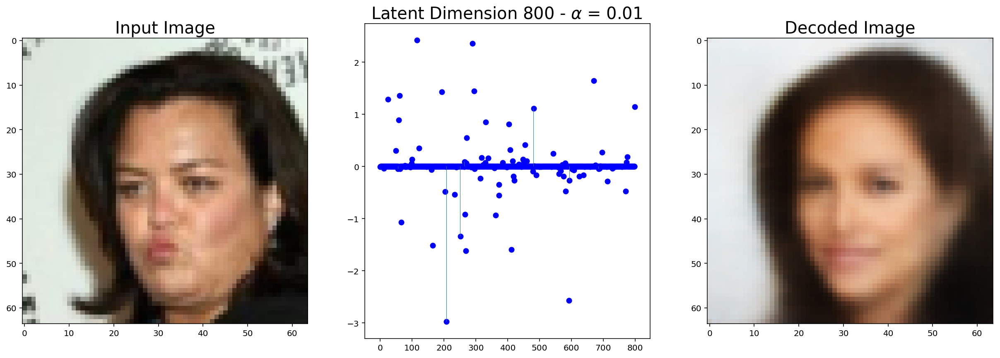

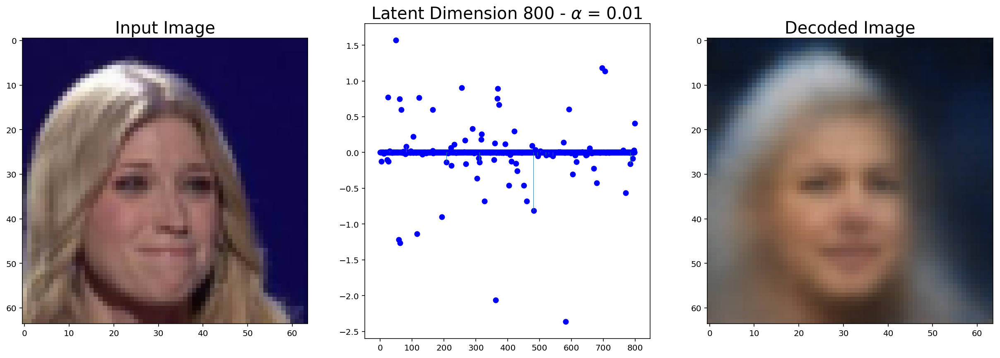

In [11]:
for i in range(15):
    plot_encoding(images[i][None,:], convvsc, 
                  model_params['latent_sz'], 
                  model_params['alpha'])

In [30]:
import random

def plot_horizontal_traversal(image, vsc, latent_sz, length, 
                              delta, threshold=1e-4, plot_all=False, 
                              plot_list=None, width=1/4):
    image = vsc.transform(image).to(vsc.device)
    decoded, mu, logvar, logspike = vsc.model.forward(image)
    z = vsc.model.reparameterize(mu, logvar, logspike)
    img = vsc.inverse_transform(vsc.model.decode(z))
    z_ = z.cpu().detach().numpy()[0]
    
    plt.bar(np.arange(latent_sz), height=z_, width=width, align='center')
    plt.scatter(np.arange(latent_sz), z_, color='blue')
    plt.show()
    
    non_zero = [i for i in range(latent_sz) if np.abs(z_[i]) > threshold]
    ind = random.choice(non_zero)
    print(ind, non_zero)
    
    if not plot_all:
        non_zero = [ind]
    if plot_list:
        non_zero = plot_list
    
    hor_traversal = []
    for ind in non_zero:
        images = []
        z1 = z.clone()
        for i in range(length):
            img = to_numpy(vsc.model.decode(z1), vsc)
            images.append(np.transpose(img, (1,2,0)))
            z1[0, ind] = z1[0, ind] + delta if z[0,ind] < 0 else z1[0, ind] - delta

        hor_traversal.append(np.concatenate(images, axis=1))
    traversal = np.concatenate(hor_traversal, axis=0)
    plt.figure(figsize=(15,25))
    plt.axis('off')
    plt.imshow(traversal)
    plt.show()
#     return traversal

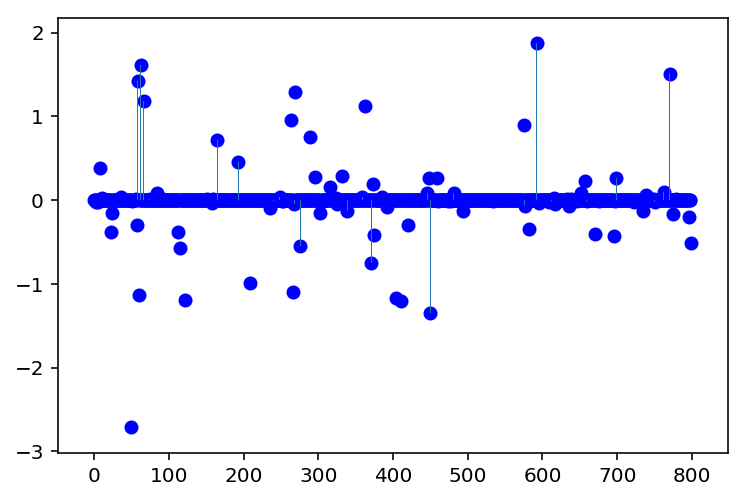

770 [8, 23, 49, 57, 58, 60, 62, 66, 112, 115, 122, 165, 193, 208, 263, 266, 269, 276, 289, 362, 371, 375, 404, 411, 450, 575, 582, 592, 670, 696, 770, 799]


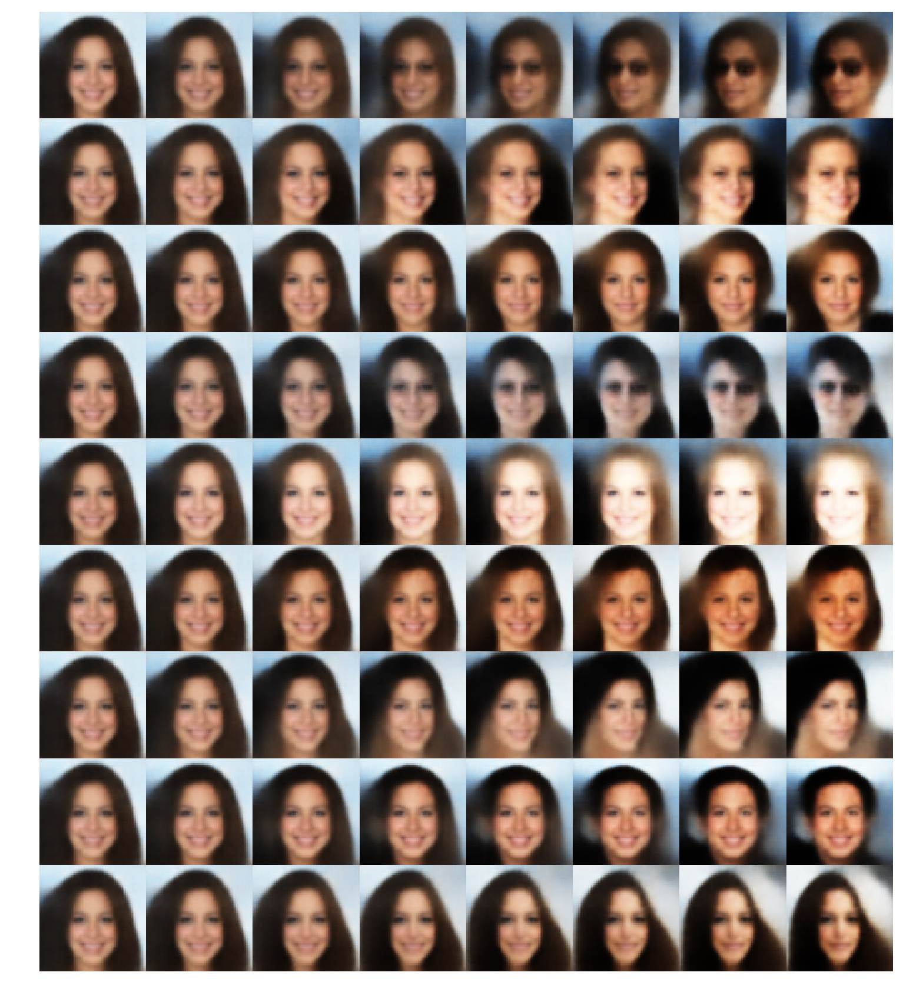

In [18]:
plot_horizontal_traversal(images[0][None,:], convvsc, 
                          model_params['latent_sz'], length=8, 
                          delta=1.1, threshold=3e-1,
                          plot_all=False, 
                          plot_list=[49, 62, 122, 208, 266,
                                     289, 411, 670, 770])

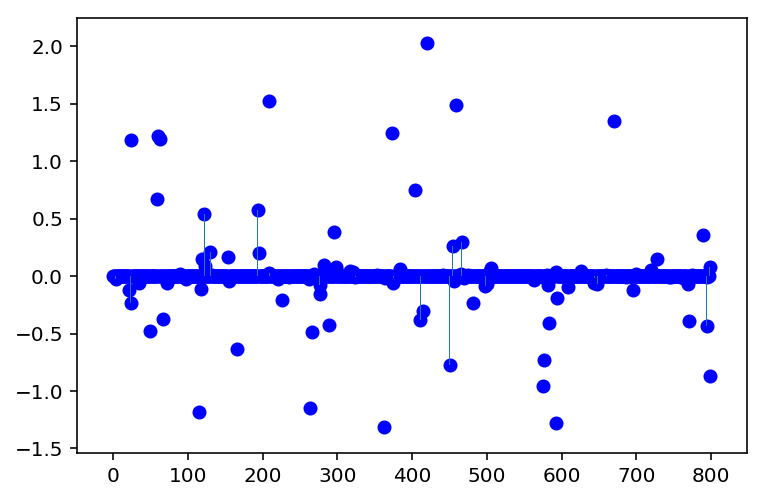

789 [24, 49, 58, 60, 62, 66, 115, 122, 165, 193, 208, 263, 266, 289, 295, 362, 373, 404, 411, 415, 420, 450, 459, 575, 576, 583, 592, 670, 770, 789, 794, 799]


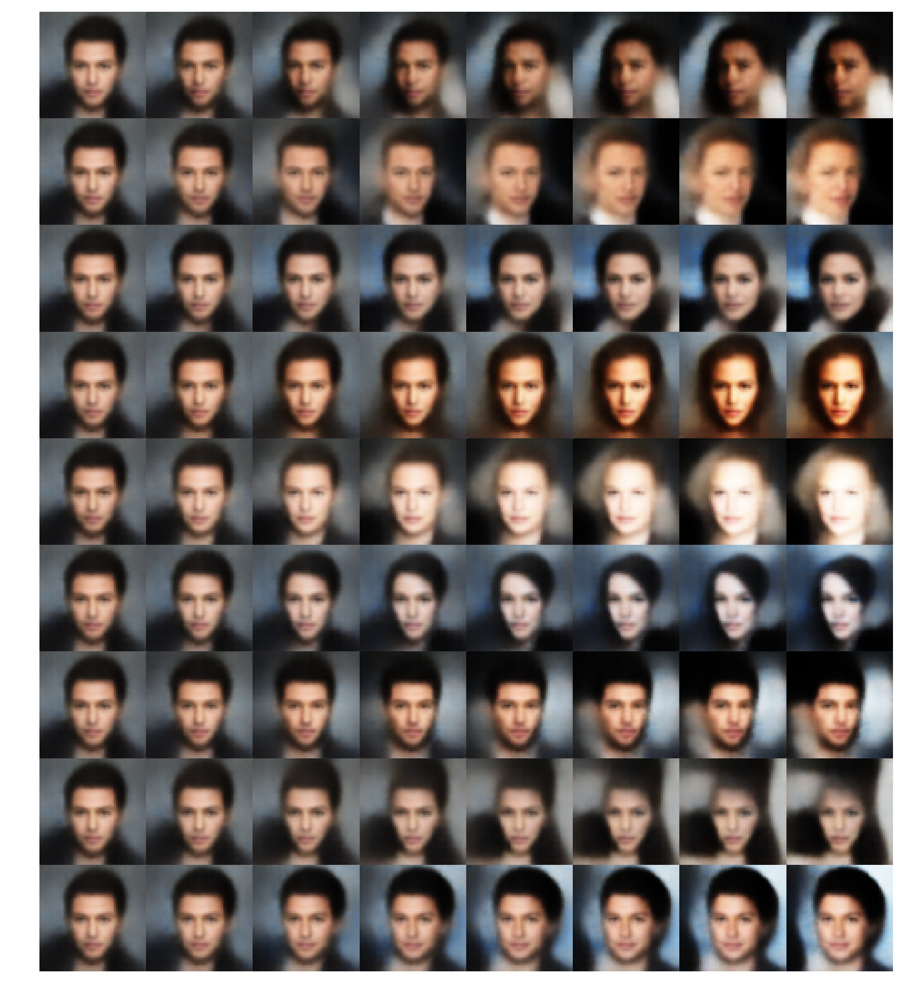

In [19]:
plot_horizontal_traversal(images[12][None,:], convvsc, 
                          model_params['latent_sz'], length=8, 
                          delta=1.1, threshold=3e-1,
                          plot_all=False, 
                          plot_list=[49, 62, 122, 208, 266,
                                     289, 411, 670, 770])

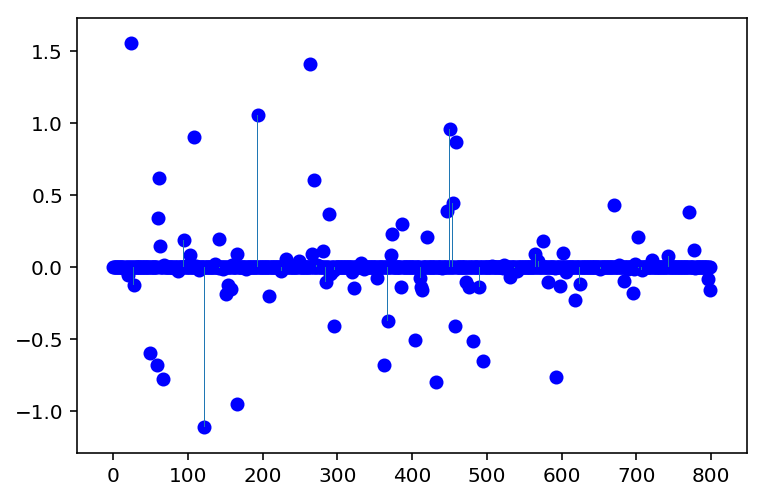

295 [24, 49, 58, 60, 61, 66, 108, 122, 165, 193, 263, 269, 289, 295, 362, 367, 404, 432, 447, 450, 454, 457, 459, 481, 495, 592, 670, 770]


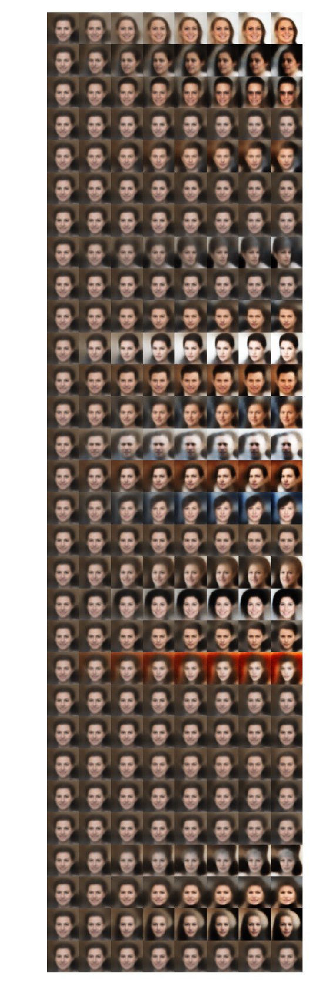

In [21]:
plot_horizontal_traversal(images[6][None,:], convvsc, 
                          model_params['latent_sz'], length=8, 
                          delta=1.1, threshold=3e-1,
                          plot_all=False, 
                          plot_list=[24, 49, 58, 66, 122, 141, 
                                     165, 193, 238, 263, 269, 289, 
                                     362, 373, 404, 450, 456, 459, 
                                     481, 575, 582, 592, 601, 610, 
                                     628, 657, 670, 696, 770, 799])

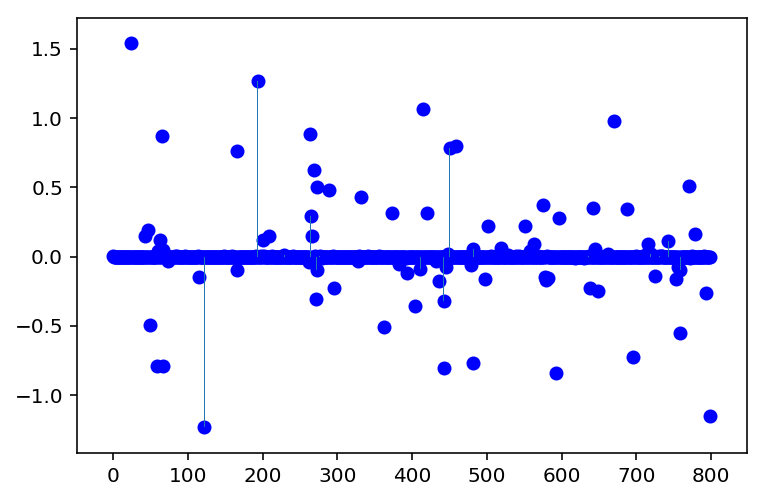

332 [24, 49, 58, 65, 66, 122, 165, 193, 263, 269, 271, 273, 289, 332, 362, 373, 404, 415, 420, 442, 443, 450, 459, 481, 575, 592, 642, 670, 688, 696, 758, 770, 799]


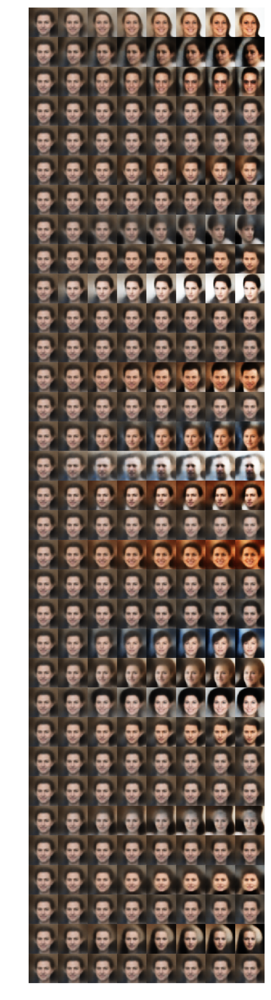

In [32]:
plot_horizontal_traversal(images[6][None,:], convvsc, 
                          model_params['latent_sz'], length=8, 
                          delta=1.1, threshold=3e-1,
                          plot_all=True, 
                          plot_list=None)

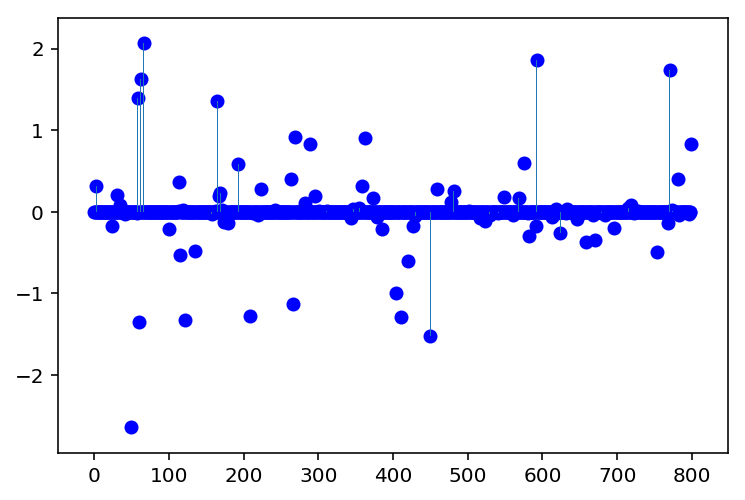

289 [3, 49, 58, 60, 62, 66, 114, 115, 122, 135, 165, 193, 208, 263, 266, 269, 289, 358, 362, 404, 411, 420, 450, 575, 592, 658, 670, 753, 770, 781, 799]


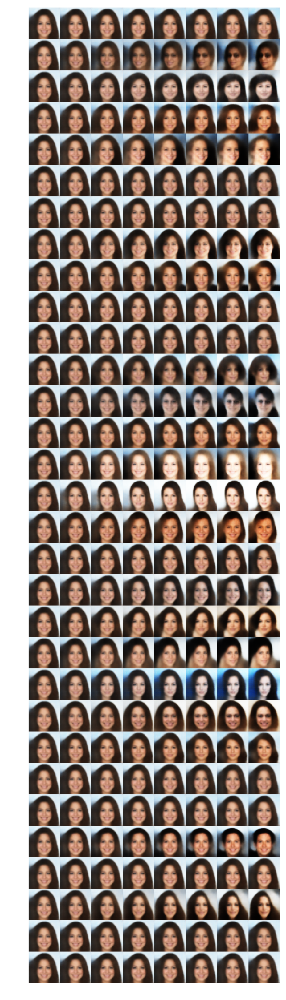

In [31]:
plot_horizontal_traversal(images[0][None,:], convvsc, 
                          model_params['latent_sz'], length=8, 
                          delta=1.1, threshold=3e-1,
                          plot_all=True, plot_list=None)